In [1]:
Sys.setlocale("LC_ALL","Chinese")

[1] "LC_COLLATE=Chinese (Simplified)_People's Republic of China.936;LC_CTYPE=Chinese (Simplified)_People's Republic of China.936;LC_MONETARY=Chinese (Simplified)_People's Republic of China.936;LC_NUMERIC=C;LC_TIME=Chinese (Simplified)_People's Republic of China.936"

In [2]:
full_data <- read.csv2('icd_data.csv',header = F,sep = ",")

In [3]:
dim(full_data)

[1] 46128     2

In [4]:
head(full_data,10)

,V1,V2
,<int>,<fct>
1,2,99.2503
2,3,99.2503
3,5,"92.2400,99.2800x003"
4,7,"68.2909,54.5100x009,69.4903,69.0901"
5,8,"65.2501,54.5100x009,65.7901"
6,9,"68.2906,54.5903"
7,11,"68.4100,66.5102,54.5100x009"
8,16,"62.6900x001,61.4904,62.5x00"
9,17,"06.2x00,04.0405,37.7800"


In [5]:
head(full_data[,2])

[1] 99.2503                             99.2503                            
[3] 92.2400,99.2800x003                 68.2909,54.5100x009,69.4903,69.0901
[5] 65.2501,54.5100x009,65.7901         68.2906,54.5903                    
10156 Levels: 00.1000 00.2400x001,88.5500 ... 99.8301

In [6]:
library(arules)
library(arulesViz)  # data visualization of association rules
library(RColorBrewer)  # color palettes for plots

Loading required package: Matrix


Attaching package: 'arules'


The following objects are masked from 'package:base':

    abbreviate, write


Loading required package: grid

Registered S3 method overwritten by 'seriation':
  method         from 
  reorder.hclust gclus



In [7]:
data <- strsplit(as.character(full_data[,2]),split = ',')

In [8]:
data

[[1]]
[1] "99.2503"

[[2]]
[1] "99.2503"

[[3]]
[1] "92.2400"     "99.2800x003"

[[4]]
[1] "68.2909"     "54.5100x009" "69.4903"     "69.0901"    

[[5]]
[1] "65.2501"     "54.5100x009" "65.7901"    

[[6]]
[1] "68.2906" "54.5903"

[[7]]
[1] "68.4100"     "66.5102"     "54.5100x009"

[[8]]
[1] "62.6900x001" "61.4904"     "62.5x00"    

[[9]]
[1] "06.2x00" "04.0405" "37.7800"

[[10]]
[1] "44.1300x001" "45.2302"    

[[11]]
[1] "68.4100"     "66.5102"     "65.2501"     "54.5100x009"

[[12]]
[1] "79.3100x005" "81.8300x006"

[[13]]
[1] "44.1401"

[[14]]
[1] "57.5100x001"

[[15]]
[1] "73.6x01"

[[16]]
[1] "40.2300"

[[17]]
[1] "74.1x01" "54.5903" "38.8609"

[[18]]
[1] "99.2503"

[[19]]
[1] "74.1x01"

[[20]]
[1] "74.1x01" "54.5903" "75.5200"

[[21]]
[1] "47.0901" "54.5903"

[[22]]
[1] "47.0100" "54.5101"

[[23]]
[1] "99.2500x017" "39.7900x020" "88.4500"     "39.9700x001"

[[24]]
[1] "36.0602"     "00.6600x004" "00.4600"     "00.4000"     "88.5500"    

[[25]]
[1] "47.0901" "54.5903"

[[26]]
[1] "03.3101"

[[27]]
[1] "47.0100" "54.5101"

[[28]]
[1] "37.1203"

[[29]]
[1] "36.0600"     "00.2400x001" "17.5500x002" "00.6600x004" "00.4700"    
[6] "00.4000"     "88.5500"    

[[30]]
[1] "75.6902"

[[31]]
[1] "04.9203"     "86.9401"     "57.3200x001"

[[32]]
[1] "74.1x01" "54.5903"

[[33]]
[1] "74.1x01" "38.8609" "54.5903"

[[34]]
[1] "70.5305"

[[35]]
[1] "74.1x01" "38.8609"

[[36]]
[1] "74.1x01" "54.5903"

[[37]]
[1] "59.7903"

[[38]]
[1] "74.1x01"

[[39]]
[1] "73.6x01"

[[40]]
[1] "75.6902"

[[41]]
[1] "74.1x01" "38.8609"

[[42]]
[1] "36.0602"     "00.6600x004" "00.4500"     "00.4000"     "88.5500"    

[[43]]
[1] "34.9103" "34.9103"

[[44]]
[1] "46.7501" "54.5903" "54.1100"

[[45]]
[1] "54.9105"

[[46]]
[1] "50.2200"

[[47]]
[1] "51.2300" "54.5101"

[[48]]
[1] "79.3600x009"

[[49]]
[1] "19.5300"     "19.3x03"     "20.0900"     "18.1100"     "29.1100x002"
[6] "31.4200x001" "21.2100"    

[[50]]
[1] "19.4x01" "20.0900" "19.3x03" "18.1100"

[[51]]
[1] "20.4901" "19.5300" "04.4203" "18.7906"

[[52]]
[1] "64.4901" "58.4502" "58.4700" "62.5x00"

[[53]]
[1] "33.2200x003"

[[54]]
[1] "81.5100" "00.7600"

[[55]]
[1] "92.2400"

[[56]]
[1] "92.2400"

[[57]]
[1] "32.4100" "40.5905"

[[58]]
[1] "38.5901"     "38.5900x003" "86.2200x011"

[[59]]
[1] "92.2400" "99.2503"

[[60]]
[1] "75.6902"

[[61]]
[1] "86.3x03"     "86.7400x026"

[[62]]
[1] "50.2205"

[[63]]
[1] "74.1x01"

[[64]]
[1] "74.1x01"     "54.5903"     "66.3900x004"

[[65]]
[1] "73.6x01" "69.0200"

[[66]]
[1] "41.3100"     "03.9200x001" "03.3101"    

[[67]]
[1] "51.2300"     "51.8500x002" "51.8600"     "51.1000"    

[[68]]
[1] "40.4200"

[[69]]
[1] "74.1x01"

[[70]]
[1] "83.1903"

[[71]]
[1] "55.0401"     "55.0300x005" "56.2x00x002" "59.8x03"     "59.8x00"    
[6] "57.3200x001" "55.2300"    

[[72]]
[1] "79.3900x043" "79.3900x051" "80.4501"     "79.3900x045"

[[73]]
[1] "65.2501"     "65.7901"     "54.5100x009"

[[74]]
[1] "75.6902"

[[75]]
[1] "50.3x01" "45.7302"

[[76]]
[1] "81.0801"     "84.5100x002" "80.5100x036" "80.5109"     "81.6200"    
[6] "78.5900x022" "78.0000x003"

[[77]]
[1] "81.5400x007" "80.7600"     "80.4601"     "80.8601"     "37.7800"    

[[78]]
[1] "47.0901"

[[79]]
[1] "74.1x01" "75.5200"

[[80]]
[1] "81.5201"

[[81]]
[1] "74.1x01"

[[82]]
[1] "79.1500x006"

[[83]]
[1] "92.2900x001" "99.2801"    

[[84]]
[1] "81.5100" "80.4501" "80.7500" "81.2100" "00.7400"

[[85]]
[1] "45.1300x001"

[[86]]
[1] "92.2400"

[[87]]
[1] "32.2001"

[[88]]
[1] "45.0201"

[[89]]
[1] "53.0204"     "45.6206"     "47.1900x001"

[[90]]
[1] "46.5100x002" "45.4200x003"

[[91]]
[1] "70.4x03"

[[92]]
[1] "85.2200"

[[93]]
[1] "68.2912"     "66.6104"     "54.5100x009"

[[94]]
[1] "68.4901" "65.2901" "54.5903" "66.5100" "65.7901"

[[95]]
[1] "55.0106" "59.0301" "55.7x01"

[[96]]
[1] "06.4x00"     "04.0405"     "40.3x00x001"

[[97]]
[1] "68.6900x001" "65.6300"     "40.5912"     "54.5101"    

[[98]]
[1] "06.2x02"     "40.3x00x002" "04.0405"    

[[99]]
[1] "06.8903" "04.0405"

[[100]]
[1] "33.2400x001"

In [9]:
anadata <- as(data,'transactions')
inspect(anadata[1:20])
summary(anadata)

Warning message in asMethod(object):
"removing duplicated items in transactions"


     items                                
[1]  {99.2503}                            
[2]  {99.2503}                            
[3]  {92.2400,99.2800x003}                
[4]  {54.5100x009,68.2909,69.0901,69.4903}
[5]  {54.5100x009,65.2501,65.7901}        
[6]  {54.5903,68.2906}                    
[7]  {54.5100x009,66.5102,68.4100}        
[8]  {61.4904,62.5x00,62.6900x001}        
[9]  {04.0405,06.2x00,37.7800}            
[10] {44.1300x001,45.2302}                
[11] {54.5100x009,65.2501,66.5102,68.4100}
[12] {79.3100x005,81.8300x006}            
[13] {44.1401}                            
[14] {57.5100x001}                        
[15] {73.6x01}                            
[16] {40.2300}                            
[17] {38.8609,54.5903,74.1x01}            
[18] {99.2503}                            
[19] {74.1x01}                            
[20] {54.5903,74.1x01,75.5200}            


transactions as itemMatrix in sparse format with
 46128 rows (elements/itemsets/transactions) and
 2307 columns (items) and a density of 0.0008226388 

most frequent items:
99.2503 88.5500 92.2400 41.3100 74.1x01 (Other) 
   4158    2356    2313    1494    1357   75865 

element (itemset/transaction) length distribution:
sizes
    1     2     3     4     5     6     7 
25113 10793  4821  2388  1739   784   490 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.898   2.000   7.000 

includes extended item information - examples:
       labels
1     00.1000
2 00.2400x001
3     00.3101

In [10]:
orderedItemFreq <- sort(itemFrequency(anadata), decreasing=T)

In [11]:
orderedItemFreq[1:10]

99.2503     88.5500     92.2400     41.3100     74.1x01     75.6902 
 0.09014048  0.05107527  0.05014308  0.03238814  0.02941814  0.02787895 
99.2800x003     03.3101 13.4100x001 13.7100x001 
 0.02683836  0.02549428  0.02362990  0.02258932

In [12]:
options(repr.plot.width=5, repr.plot.height=10, repr.plot.pointsize=6)

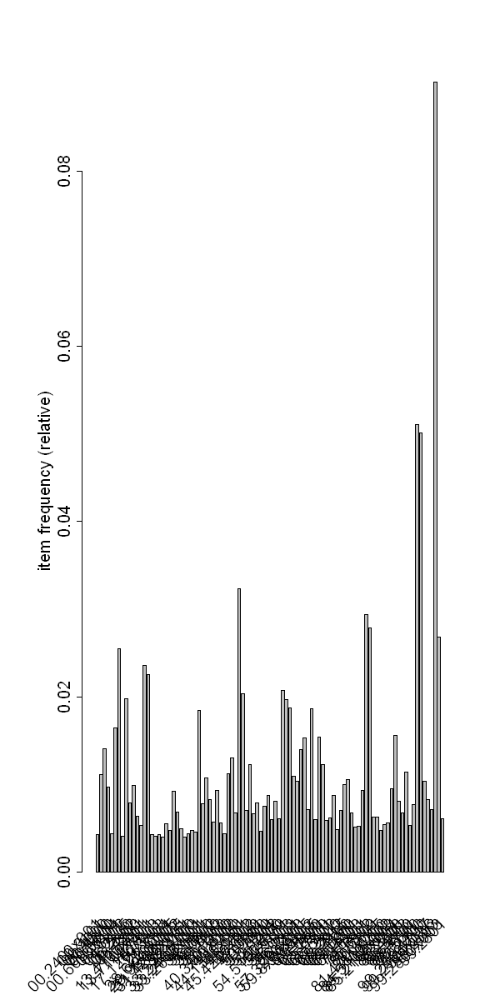

In [13]:
itemFrequencyPlot(anadata, support=0.004)

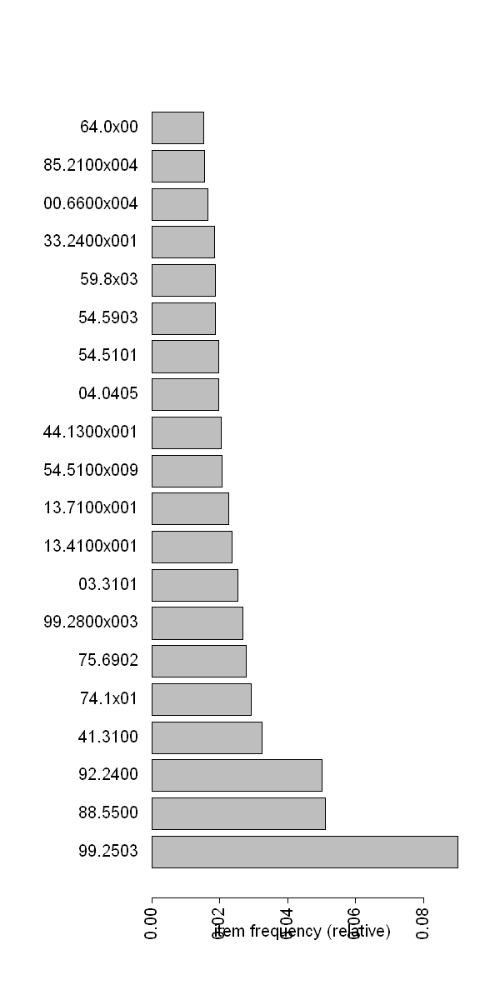

In [14]:
itemFrequencyPlot(anadata, topN=20, horiz=T)

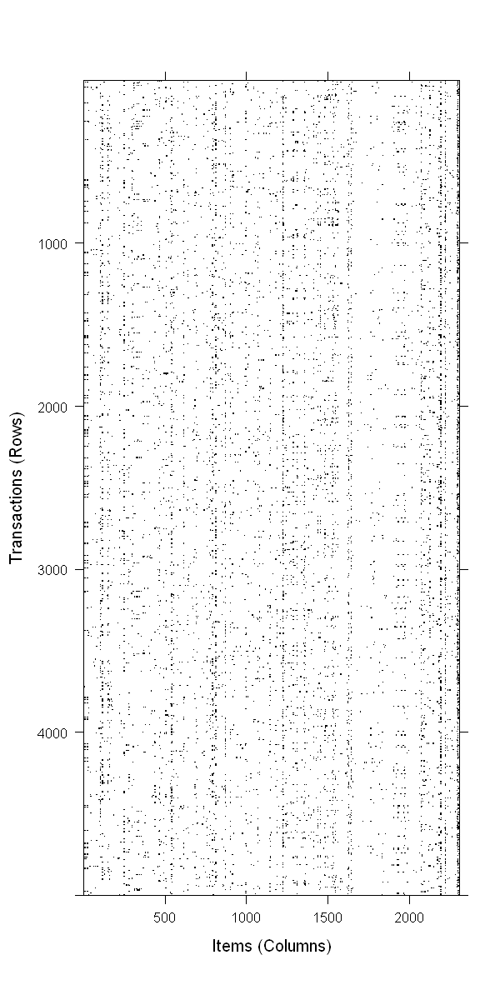

In [15]:
set.seed(2019)
image(sample(anadata,5000))

In [16]:
rules <- apriori(anadata, parameter = list(support = 0.001, confidence = 0.25, minlen = 2))
summary(rules)

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
       0.25    0.1    1 none FALSE            TRUE       5   0.001      2
 maxlen target   ext
     10  rules FALSE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 46 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[2307 item(s), 46128 transaction(s)] done [0.03s].
sorting and recoding items ... [315 item(s)] done [0.00s].
creating transaction tree ... done [0.01s].
checking subsets of size 1 2 3 4 5 6 done [0.00s].
writing ... [1363 rule(s)] done [0.00s].
creating S4 object  ... done [0.00s].


set of 1363 rules

rule length distribution (lhs + rhs):sizes
  2   3   4   5   6 
450 479 307 116  11 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   2.00    2.00    3.00    3.09    4.00    6.00 

summary of quality measures:
    support           confidence          lift             count       
 Min.   :0.001019   Min.   :0.2500   Min.   :  3.635   Min.   :  47.0  
 1st Qu.:0.001236   1st Qu.:0.5340   1st Qu.: 59.045   1st Qu.:  57.0  
 Median :0.001539   Median :0.7524   Median : 87.700   Median :  71.0  
 Mean   :0.002539   Mean   :0.7221   Mean   :123.557   Mean   : 117.1  
 3rd Qu.:0.002526   3rd Qu.:0.9423   3rd Qu.:164.342   3rd Qu.: 116.5  
 Max.   :0.022394   Max.   :1.0000   Max.   :741.929   Max.   :1033.0  

mining info:
    data ntransactions support confidence
 anadata         46128   0.001       0.25

In [17]:
ordered_rules <- sort(rules, by="lift")
inspect(ordered_rules[1:5])

    lhs                                  rhs           support     confidence
[1] {80.5100x008}                     => {81.0200x001} 0.001127298 0.9811321 
[2] {81.0200x001}                     => {80.5100x008} 0.001127298 0.8524590 
[3] {80.5100x008,81.6200}             => {81.0200x001} 0.001083940 0.9803922 
[4] {80.5100x008,84.5100x002}         => {81.0200x001} 0.001062262 0.9800000 
[5] {80.5100x008,81.6200,84.5100x002} => {81.0200x001} 0.001018904 0.9791667 
    lift     count
[1] 741.9289 52   
[2] 741.9289 52   
[3] 741.3693 50   
[4] 741.0728 49   
[5] 740.4426 47   


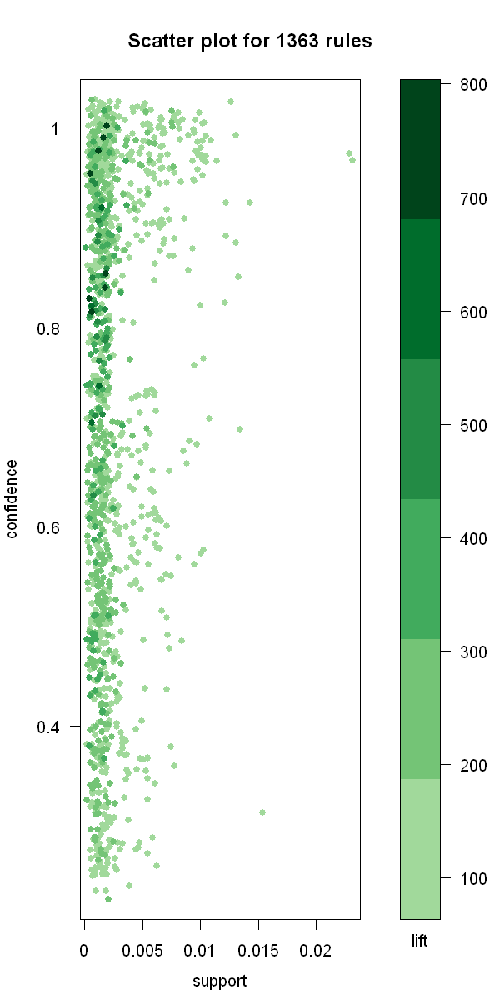

In [18]:
plot(ordered_rules, control=list(jitter=2, col = rev(brewer.pal(9, "Greens")[4:9])), shading = "lift") 

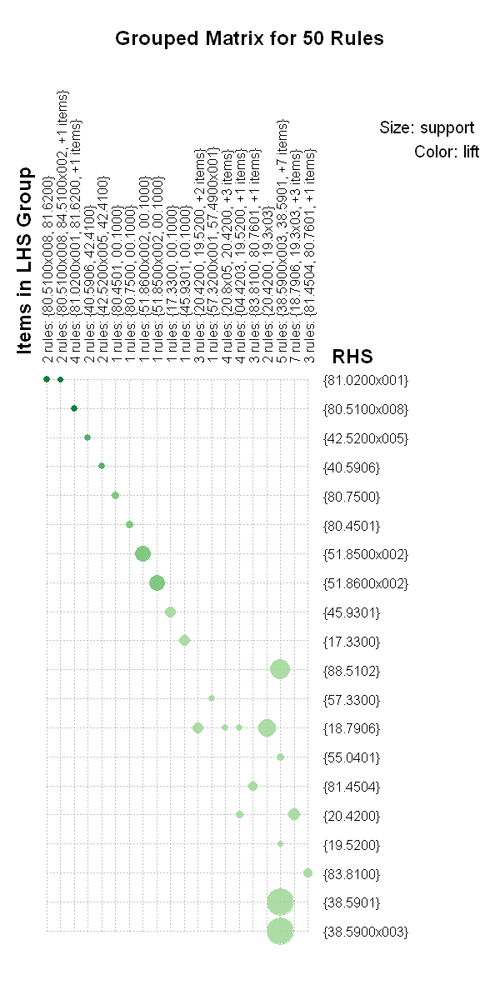

In [21]:
plot(ordered_rules[1:50],method = 'grouped',control=list(col = rev(brewer.pal(9, "Greens")[4:9])),rhs_max=30)

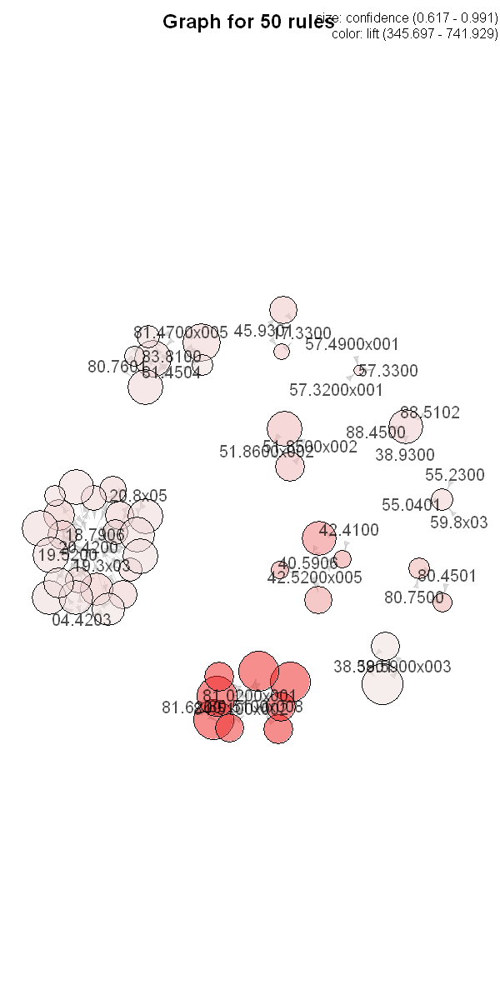

In [20]:
plot(ordered_rules[1:50], measure="confidence", method="graph", shading = "lift")